## 1. 환경 및 seed 설정

- Epoch: 20
- Seed: 42
- Optimizer: SGD (`lr=0.001`)
- MixUp/CutMix alpha: 1.0
- 입력 크기: `3 x 224 x 224`


In [47]:
from pathlib import Path
import copy
import gc
import json
import random
import time

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Subset, random_split
from torchvision.datasets import ImageFolder


SEED = 42
EPOCHS = 20
BATCH_SIZE = 16
LEARNING_RATE = 0.001
MIX_ALPHA = 1.0
# 데이터 로딩과 augmentation을 병렬 처리
NUM_WORKERS = 2
COOLDOWN_EVERY_EPOCHS = 5
COOLDOWN_SECONDS = 60

DATASET_DIR = Path("~/datasets/stanfordimagenetdogs/Images").expanduser()
# 결과는 results에 표(csv, png), \histories에 학습 기록 저장  
RESULT_DIR = Path("results_resnet50_aug")
HISTORY_DIR = RESULT_DIR / "histories"
ALPHA02_RESULT_DIR = Path("results_resnet50_aug_alpha02")
RESULT_DIR.mkdir(parents=True, exist_ok=True)
HISTORY_DIR.mkdir(parents=True, exist_ok=True)

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

#동일한 실험환경 구성하기 위해 시드 고정(42)
def set_seed(seed=SEED):  
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)


set_seed()
print(f"Device: {DEVICE}")
print(f"Dataset: {DATASET_DIR}")
print(f"Results: {RESULT_DIR.resolve()}")


Device: cuda
Dataset: /home/thkim0/datasets/stanfordimagenetdogs/Images
Results: /home/thkim0/github/AIFFEL_quest_rs/Exploration/Ex03/results_resnet50_aug


### Dataset & Transform

mean, std = 0.5
validation 데이터에는 resize, tensor 변환, normalize만 적용하며 augmentation은 적용x

---

augment_basic : 0.5 확률로 좌우반전 + colorjitter brightness 0.1  
augment_morejitter : jitter를 대비, 채도에 대해서도 적용  
augment_rotationaug : morejitter에 ~5도 회전 적용  


In [ ]:
if not DATASET_DIR.exists():
    raise FileNotFoundError(
        f"데이터셋을 찾을 수 없습니다: {DATASET_DIR}\n"
    )


def base_transform():
    return transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(
            mean=[0.5, 0.5, 0.5],
            std=[0.5, 0.5, 0.5],
        ),
    ])


def augment_basic():
    return transforms.Compose([
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.ColorJitter(brightness=0.1),
    ])


def augment_morejitter(): # 색상 변화(jitter)가 좀 더 추가된 버전 
    return transforms.Compose([
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.ColorJitter(
            brightness=0.1,
            contrast=0.1,
            saturation=0.1,
        ),
    ])


def augment_rotationaug(): # 좌우 회전이 더 추가된 버전 
    return transforms.Compose([
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.RandomRotation(degrees=5),
        transforms.ColorJitter(
            brightness=0.1,
            contrast=0.1,
            saturation=0.1,
        ),
    ])


AUGMENTATIONS = {
    "none": None,
    "basic": augment_basic,
    "morejitter": augment_morejitter,
    "rotationaug": augment_rotationaug,
}

# 데이터셋 정보 출력 
full_dataset = ImageFolder(root=DATASET_DIR, transform=base_transform())
total_size = len(full_dataset)
train_size = int(0.583 * total_size)
val_size = total_size - train_size

# 데이터셋 분리(훈련/검증)
split_generator = torch.Generator().manual_seed(SEED)
train_subset, val_subset = random_split(
    full_dataset,
    [train_size, val_size],
    generator=split_generator,
)

class_names = full_dataset.classes
num_classes = len(class_names)

print(f"Classes: {num_classes}")
print(f"Train: {len(train_subset):,} | Validation: {len(val_subset):,}")


Classes: 120
Train: 11,998 | Validation: 8,582


In [ ]:
# 증강마다 각각의 모델을 만듦 
def compose_train_transform(augmentation_name):
    augmentation_factory = AUGMENTATIONS[augmentation_name]
    if augmentation_factory is None:
        return base_transform()

# base에서 resize, totensor, normalize하고 factory에서 aug 가져와 합침 
    return transforms.Compose([
        *augmentation_factory().transforms,
        *base_transform().transforms,
    ])

# 데이터로더 
def make_loader(subset, augmentation_name="none", is_validation=False, seed=SEED):
    dataset_copy = copy.copy(subset.dataset)
    dataset_copy.transform = (
        base_transform()
        if is_validation
        else compose_train_transform(augmentation_name) # train일때만 aug 적용 
    )
    isolated_subset = Subset(dataset_copy, subset.indices)
    generator = torch.Generator().manual_seed(seed)

    return DataLoader(
        isolated_subset,
        batch_size=BATCH_SIZE,
        shuffle=not is_validation, # val때는 안섞어도 무방 
        num_workers=NUM_WORKERS,
        pin_memory=torch.cuda.is_available(),
        generator=generator,
    )


val_loader = make_loader(
    val_subset,
    augmentation_name="none",
    is_validation=True,
)

sample_loader = make_loader(train_subset, augmentation_name="basic")
sample_images, sample_labels = next(iter(sample_loader))
print(f"Batch shape: {sample_images.shape}")
assert sample_images.shape[1:] == (3, 224, 224)


Batch shape: torch.Size([16, 3, 224, 224])


### 3. Augmentation 시각화 및 강도 점검



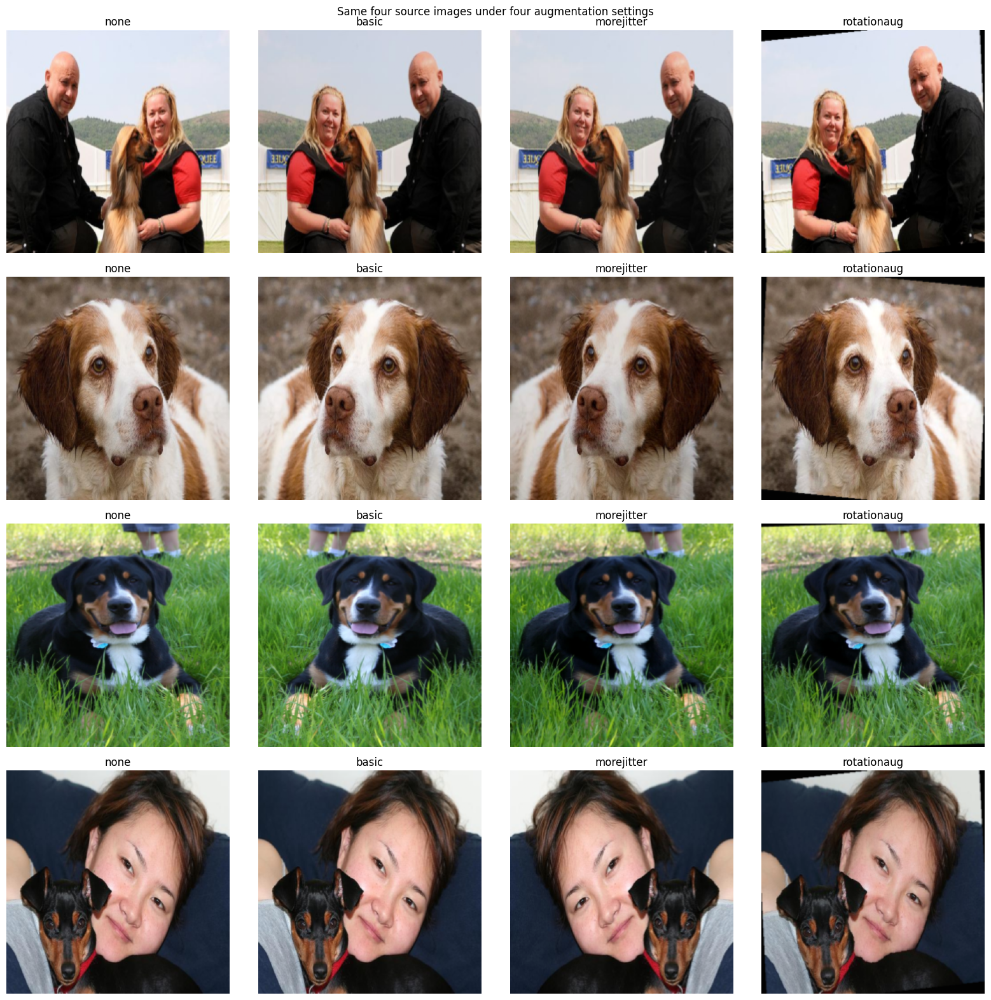

Source A: n02088094-Afghan_hound | /home/thkim0/datasets/stanfordimagenetdogs/Images/n02088094-Afghan_hound/n02088094_4583.jpg
Source B: n02101388-Brittany_spaniel | /home/thkim0/datasets/stanfordimagenetdogs/Images/n02101388-Brittany_spaniel/n02101388_5149.jpg
Source C: n02107574-Greater_Swiss_Mountain_dog | /home/thkim0/datasets/stanfordimagenetdogs/Images/n02107574-Greater_Swiss_Mountain_dog/n02107574_2582.jpg
Source D: n02107312-miniature_pinscher | /home/thkim0/datasets/stanfordimagenetdogs/Images/n02107312-miniature_pinscher/n02107312_7717.jpg


In [ ]:
from contextlib import contextmanager
from PIL import Image


VISUALIZATION_SEED = SEED + 1000
AUGMENTATION_NAMES = ["none", "basic", "morejitter", "rotationaug"]
SOURCE_KEYS = ["a", "b", "c", "d"]


def denormalize(image):
    return torch.clamp(image * 0.5 + 0.5, 0, 1) # norm -> [-1, 1] ==> denorm -> [0,1]


@contextmanager
def isolated_visualization_seed(seed=VISUALIZATION_SEED):
    """시각화의 난수 사용이 이후 학습 결과에 영향을 주지 않게 격리합니다."""
    python_state = random.getstate()
    numpy_state = np.random.get_state()
    torch_state = torch.get_rng_state()
    cuda_states = (
        torch.cuda.get_rng_state_all() if torch.cuda.is_available() else None
    )

    set_seed(seed)
    try:
        yield # with 
    finally:  # 끝나고 복원 
        random.setstate(python_state)
        np.random.set_state(numpy_state)
        torch.set_rng_state(torch_state)
        if cuda_states is not None:
            torch.cuda.set_rng_state_all(cuda_states)


# 3번과 4번에서 공통으로 사용할 서로 다른 견종 이미지 네 장을 한 번만 선택합니다.
selected_sources = []
selected_labels = set()
for dataset_index in train_subset.indices:
    candidate_path, candidate_label = full_dataset.samples[dataset_index]
    if candidate_label in selected_labels:
        continue

    selected_sources.append((candidate_path, candidate_label))
    selected_labels.add(candidate_label)
    if len(selected_sources) == 4:
        break

if len(selected_sources) < 4:
    raise RuntimeError("서로 다른 label을 가진 시각화용 이미지 네 장을 찾지 못했습니다.")

(
    (source_a_path, source_a_label),
    (source_b_path, source_b_label),
    (source_c_path, source_c_label),
    (source_d_path, source_d_label),
) = selected_sources

source_paths = {
    "a": source_a_path,
    "b": source_b_path,
    "c": source_c_path,
    "d": source_d_path,
}
source_labels = {
    "a": source_a_label,
    "b": source_b_label,
    "c": source_c_label,
    "d": source_d_label,
}


def show_augmentation_examples():
    source_images = {
        key: Image.open(source_paths[key]).convert("RGB")
        for key in SOURCE_KEYS
    }

    # 4번에서 같은 변환 결과를 그대로 사용하도록 tensor도 함께 보관합니다.
    transformed_examples = {}
    with isolated_visualization_seed():
        for name in AUGMENTATION_NAMES:
            transformed_examples[name] = {
                key: compose_train_transform(name)(image)
                for key, image in source_images.items()
            }

    fig, axes = plt.subplots(
        len(SOURCE_KEYS),
        len(AUGMENTATION_NAMES),
        figsize=(16, 16),
    )
    for row, key in enumerate(SOURCE_KEYS):
        for col, name in enumerate(AUGMENTATION_NAMES):
            transformed = transformed_examples[name][key]
            assert transformed.shape == (3, 224, 224)

            image = denormalize(transformed).permute(1, 2, 0).numpy()
            axes[row, col].imshow(image)
            axes[row, col].set_title(name)
            axes[row, col].axis("off")

        axes[row, 0].set_ylabel(
            f"Source {key.upper()}\n{class_names[source_labels[key]]}",
            fontsize=11,
        )

    fig.suptitle("Same four source images under four augmentation settings")
    plt.tight_layout()
    plt.show()
    return transformed_examples


visualization_examples = show_augmentation_examples()
for key in SOURCE_KEYS:
    print(
        f"Source {key.upper()}: "
        f"{class_names[source_labels[key]]} | {source_paths[key]}"
    )

jitter계열 augmentation의 경우 아주 미묘하지만 분명 색감과 밝기의 차이가 존재하긴 한다...


### 4. 동일한 초기 모델과 MixUp/CutMix 정의

mixup : lam\*image1, (1-lam)\*image2만큼 두 사진을 섞음  
cutmix : 1-lam 만큼의 비율을 잘라다 다른 사진에 붙임 -> lam^2의 면적 교체   

pretrained convolution 가중치와 새 FC layer까지 포함한 `initial_model_state`를 한 번만 만들고,
각 실험 모델에 동일하게 복사

위에서 사용했던 이미지들에 MixUp/CutMix가 어떻게 적용되었는지 확인 


In [ ]:
set_seed()
base_model = models.resnet50(
    weights=models.ResNet50_Weights.IMAGENET1K_V1
)
base_model.fc = nn.Linear(base_model.fc.in_features, num_classes)
initial_model_state = copy.deepcopy(base_model.state_dict())
del base_model


def create_model():
    model = models.resnet50(weights=None)
    model.fc = nn.Linear(model.fc.in_features, num_classes)
    model.load_state_dict(initial_model_state)
    return model


def mixup_batch(images, labels, alpha=MIX_ALPHA):
    lam = float(np.random.beta(alpha, alpha))
    indices = torch.randperm(images.size(0), device=images.device)
    mixed_images = lam * images + (1.0 - lam) * images[indices]
    return mixed_images, labels, labels[indices], lam


def cutmix_batch(images, labels, alpha=MIX_ALPHA):
    lam = float(np.random.beta(alpha, alpha))
    indices = torch.randperm(images.size(0), device=images.device)

    height, width = images.shape[-2:]
    cut_ratio = np.sqrt(1.0 - lam) # 자를 비율 <- 1 - lam
    cut_width = int(width * cut_ratio) # patch 크기 계산
    cut_height = int(height * cut_ratio)

    # 나중엔 semantic seg -> bbox 받아서 그 정보를 여기에 넣는걸로 ( -> 그렇게 되면 면적 차이날때는 어떻게? 평균낼까)
    center_x = torch.randint(width, (1,), device=images.device).item() # 잘라낼 영역의 중심점 -> 랜덤
    center_y = torch.randint(height, (1,), device=images.device).item() 
   

    x1 = max(center_x - cut_width // 2, 0) # patch의 왼쪽 아래 x 좌표, patch가 안삐져나가게 min/max 사용 
    x2 = min(center_x + cut_width // 2, width) 
    y1 = max(center_y - cut_height // 2, 0) # patch의 왼쪽 아래 y좌표 
    y2 = min(center_y + cut_height // 2, height)

    mixed_images = images.clone() # 복사해서 작업 
    mixed_images[:, :, y1:y2, x1:x2] = images[ # patch 서로 교체 
        indices, :, y1:y2, x1:x2
    ]

    replaced_ratio = ((x2 - x1) * (y2 - y1)) / (width * height) # 실제 교체된 비율(patch가 넘어갔으면 잘림)
    adjusted_lam = float(1.0 - replaced_ratio)
    assert 0.0 <= adjusted_lam <= 1.0

    return mixed_images, labels, labels[indices], adjusted_lam

# lam 정상범위[0,1] 확인 
test_images = torch.randn(4, 3, 224, 224, device=DEVICE)
test_labels = torch.arange(4, device=DEVICE)
_, _, _, test_mixup_lam = mixup_batch(test_images, test_labels)
_, _, _, test_cutmix_lam = cutmix_batch(test_images, test_labels)
assert 0.0 <= test_mixup_lam <= 1.0
assert 0.0 <= test_cutmix_lam <= 1.0
del test_images, test_labels


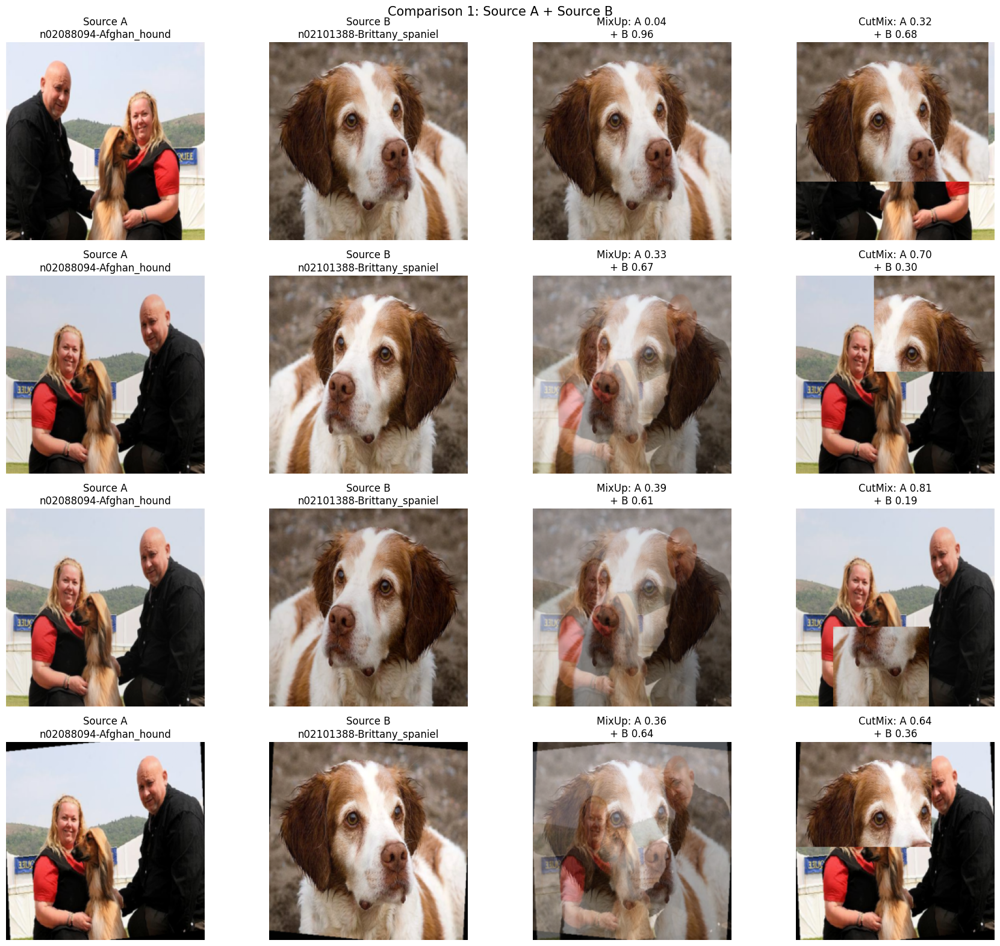

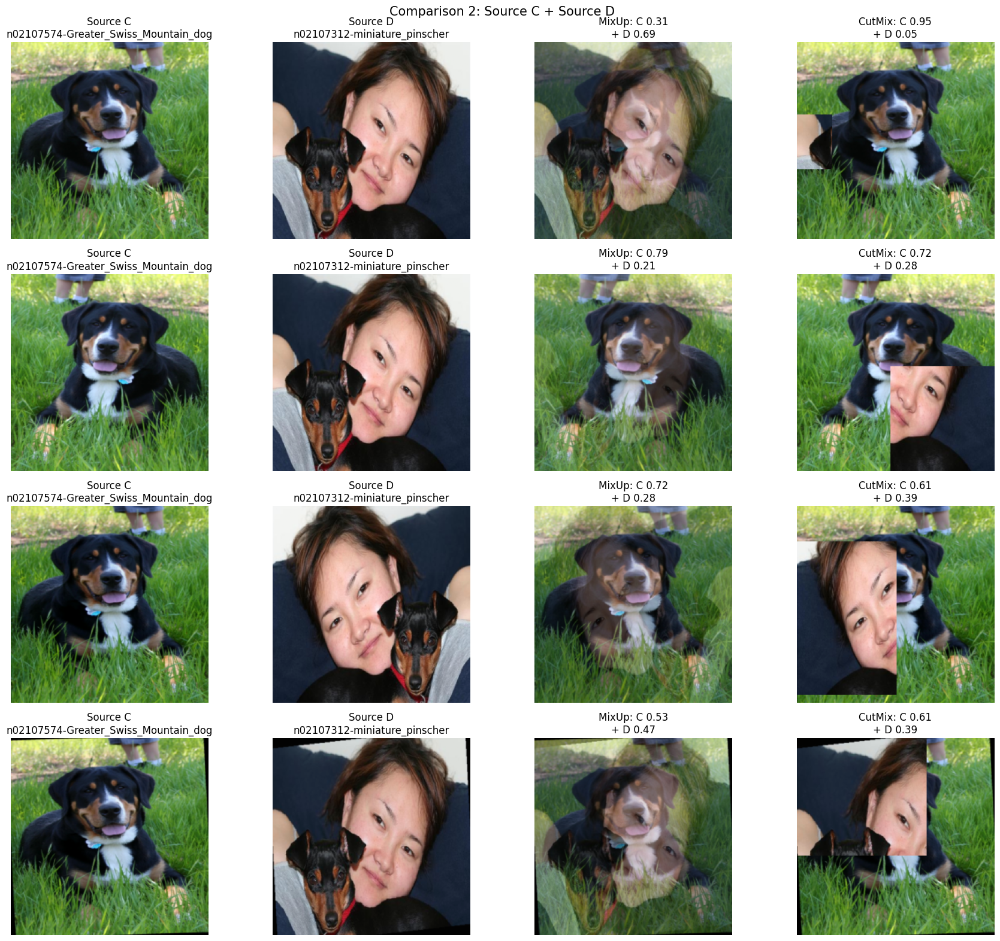

In [44]:
def apply_cross_pair(batch_images, batch_labels, mix_function):
    """시각화에서는 첫 이미지가 반드시 두 번째 이미지와 섞이게 합니다."""
    for _ in range(100):
        mixed, labels_a, labels_b, lam = mix_function(
            batch_images,
            batch_labels,
        )
        if labels_b[0].item() == batch_labels[1].item():
            return mixed, labels_a, labels_b, lam
    raise RuntimeError("두 source의 교차 pairing을 생성하지 못했습니다.")


def show_mixup_cutmix_pair(first_key, second_key, comparison_number):
    first_label = source_labels[first_key]
    second_label = source_labels[second_key]
    labels = torch.tensor(
        [first_label, second_label],
        dtype=torch.long,
    )
    fig, axes = plt.subplots(
        len(AUGMENTATION_NAMES),
        4,
        figsize=(18, 16),
    )

    with isolated_visualization_seed(
        VISUALIZATION_SEED + comparison_number
    ):
        for row, name in enumerate(AUGMENTATION_NAMES):
            first_source = visualization_examples[name][first_key]
            second_source = visualization_examples[name][second_key]
            batch_images = torch.stack([first_source, second_source])
            assert batch_images.shape == (2, 3, 224, 224)

            mixup_images, _, _, mixup_lam = apply_cross_pair(
                batch_images,
                labels,
                mixup_batch,
            )
            cutmix_images, _, _, cutmix_lam = apply_cross_pair(
                batch_images,
                labels,
                cutmix_batch,
            )

            assert mixup_images[0].shape == (3, 224, 224)
            assert cutmix_images[0].shape == (3, 224, 224)
            assert 0.0 <= mixup_lam <= 1.0
            assert 0.0 <= cutmix_lam <= 1.0

            display_images = [
                first_source,
                second_source,
                mixup_images[0],
                cutmix_images[0],
            ]
            first_name = first_key.upper()
            second_name = second_key.upper()
            display_titles = [
                f"Source {first_name}\n{class_names[first_label]}",
                f"Source {second_name}\n{class_names[second_label]}",
                (
                    f"MixUp: {first_name} {mixup_lam:.2f}\n"
                    f"+ {second_name} {1.0 - mixup_lam:.2f}"
                ),
                (
                    f"CutMix: {first_name} {cutmix_lam:.2f}\n"
                    f"+ {second_name} {1.0 - cutmix_lam:.2f}"
                ),
            ]

            for col, (image_tensor, title) in enumerate(
                zip(display_images, display_titles)
            ):
                image = (
                    denormalize(image_tensor)
                    .permute(1, 2, 0)
                    .cpu()
                    .numpy()
                )
                axes[row, col].imshow(image)
                axes[row, col].set_title(title)
                axes[row, col].axis("off")

            axes[row, 0].set_ylabel(name, fontsize=12)

    fig.suptitle(
        (
            f"Comparison {comparison_number}: "
            f"Source {first_key.upper()} + Source {second_key.upper()}"
        ),
        fontsize=15,
    )
    plt.tight_layout()
    plt.show()


show_mixup_cutmix_pair("a", "b", comparison_number=1)
show_mixup_cutmix_pair("c", "d", comparison_number=2)

사진에서 보이듯 cutmix가 랜덤으로 영역을 골라 붙이는 방식이기 때문에 큰 도움을 못 줬을 가능성이 있을 것 같은데, 생각보다 결과는 가장 좋긴 했다.  

-> 나중에 semantic segmentation을 통해 bbox를 얻고 cutmix를 적용하면 더 좋은 결과가 나오지 않을까

## 5. 공통 학습·검증 함수

일반 augmentation과 MixUp/CutMix 실험이 같은 history 구조를 사용  

MixUp의 train accuracy는 두 label에 대한 CE를 lam 비율로 가중합한 값(사진이 섞이면 정확도도 섞여야 하니까)  
CutMix의 경우 면적 비율로 가중합  
validation에서는 원래 레이블에 일반 CE  

`
loss = lam * criterion(outputs, labels_a) + (1 - lam) * criterion(outputs, labels_b)
`


In [ ]:
def evaluate(model, data_loader, criterion):
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        for images, labels in data_loader:
            images = images.to(DEVICE, non_blocking=True)
            labels = labels.to(DEVICE, non_blocking=True)

            outputs = model(images)
            loss = criterion(outputs, labels)

            batch_size = labels.size(0)
            running_loss += loss.item() * batch_size
            correct += outputs.argmax(dim=1).eq(labels).sum().item()
            total += batch_size

    return running_loss / total, 100.0 * correct / total


def train_experiment(model, train_loader, val_loader, experiment, epochs=EPOCHS):
    set_seed(SEED)
    model = model.to(DEVICE)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=LEARNING_RATE)
    history = {
        "experiment": experiment["name"],
        "train_loss": [],
        "train_accuracy": [],
        "val_loss": [],
        "val_accuracy": [],
    }

    for epoch in range(1, epochs + 1):
        model.train()
        running_loss = 0.0
        weighted_correct = 0.0
        total = 0

        for images, labels in train_loader:
            images = images.to(DEVICE, non_blocking=True)
            labels = labels.to(DEVICE, non_blocking=True)
            batch_mix = experiment["batch_mix"]

            if batch_mix == "mixup":
                model_images, labels_a, labels_b, lam = mixup_batch(
                    images, labels
                )
            elif batch_mix == "cutmix":
                model_images, labels_a, labels_b, lam = cutmix_batch(
                    images, labels
                )
            else: # 일반 학습도 같은 loss를 쓰기 위해 lam, labels 설정 
                model_images = images
                labels_a = labels_b = labels
                lam = 1.0

            optimizer.zero_grad()
            outputs = model(model_images)
            loss = (
                lam * criterion(outputs, labels_a) # label a 기준 loss를 lam 비율만큼
                + (1.0 - lam) * criterion(outputs, labels_b) # label b 기준  
            )
            loss.backward()
            optimizer.step()
            # weighed training accuracy 구현(예측이 label a와 같으면 lam만큼, b와 같으며ㅓㄴ 1-lam 만큼 맞은걸로) 
            predicted = outputs.argmax(dim=1)
            batch_size = labels.size(0)
            running_loss += loss.item() * batch_size
            weighted_correct += (   
                lam * predicted.eq(labels_a).sum().item()
                + (1.0 - lam) * predicted.eq(labels_b).sum().item()
            )
            total += batch_size

        train_loss = running_loss / total
        train_accuracy = 100.0 * weighted_correct / total
        val_loss, val_accuracy = evaluate(model, val_loader, criterion) # val acc는 cut 적용 안되니까 그대로 

        history["train_loss"].append(train_loss)
        history["train_accuracy"].append(train_accuracy)
        history["val_loss"].append(val_loss)
        history["val_accuracy"].append(val_accuracy)

        print(
            f"[{experiment['name']}] Epoch {epoch:02d}/{epochs} | "
            f"train loss {train_loss:.4f} | "
            f"train acc {train_accuracy:.2f}% | "
            f"val loss {val_loss:.4f} | "
            f"val acc {val_accuracy:.2f}%"
        )
        # 5 epoch마다 쉬어줌
        if epoch % COOLDOWN_EVERY_EPOCHS == 0 and epoch < epochs:
            print(
                f"GPU 냉각을 위해 {COOLDOWN_SECONDS}초간 대기합니다. "
                f"({epoch}/{epochs} epoch 완료)"
            )
            time.sleep(COOLDOWN_SECONDS)

    return history


![4valacc](./node2cvalacc.png)


### 기본 실험 결과 - no aug, basic aug ( + mixup / cutmix)  

Augmentation이 데이터셋에 조작을 가해 좀 더 풍성하게 만들어서 데이터셋이 넓어진 것 같은 효과를 주기 때문에 정확도가 좋아지기만 할 것으로 예상을 했었는데 실제 결과는 정반대로 Basic augmentation이 아주 아주 아주 아주 아주 아주 아주 근소하게 나아지는 성능을 보였고, mixup이나 cutmix를 적용한 모델들은 오히려 성능이 떨어지는 모습을 보였다. 
(no aug과 basic의 그래프는 가장 위에 겹쳐있다. 모든 구간에서 차이가 미미했다.)

이 현상에 대해 다음과 같이 소결론을 내고 다른 실험을 기획하였다.  
 - 1. alpha = 0.1이 과도했을 가능성 - 이 상태에서는 0~1이 균등하게 나와 이미지가 매우 강하게(반반 느낌으로) 섞인다. 이 때문에 세밀한 feature에 대한 학습이 미진했을 가능성이 있다고 생각하여 alpha = 0.2을 적용해 0, 1쪽으로 붙는 분포를 이용해 한쪽의 특성이 강한 데이터로 실험을 하기로 계획했다.  
 - 2. 학습 미수렴 가능성 - 노드 본문에서도 epoch = 20은 되어야 원활한 수렴으로 효과를 확인할 수 있다고 하기도 했고, 그래프 상으로도 아직 올라가고 있는 느낌이라 뒤바뀌거나 할 가능성은 적겠지만 일단 두고는 봐야 하겠다는 생각이 들었다. 
 - 3. cut 계열이 애초에 basic aug이 적용된 상태라, 이게 너무 과도했을 가능성 - aug를 분리하여 관찰 
 - 4. 혹은 augmentation이 약했을 가능성 - 노드에 나왔던 augment2()를 적용해서 10 epoch를 돌려보았으나 60%대로 나와서 폐기(지워버려서 자세히 볼수가 없음)


### 6. 추가 실험 설정과 결과 저장 

`training_history.csv`는 실험이 하나 끝날 때마다 다시 저장됩니다.
따라서 장시간 실행 중 중단되더라도 완료된 실험 결과는 남습니다.


In [17]:
EXPERIMENTS = [
    {"name": "no_aug", "augmentation": "none", "batch_mix": "none"},
    {"name": "basic", "augmentation": "basic", "batch_mix": "none"},
    {"name": "morejitter", "augmentation": "morejitter", "batch_mix": "none"},
    {"name": "rotationaug", "augmentation": "rotationaug", "batch_mix": "none"},
    {"name": "basic_mixup", "augmentation": "basic", "batch_mix": "mixup"},
    {"name": "basic_cutmix", "augmentation": "basic", "batch_mix": "cutmix"},
    {"name": "morejitter_mixup", "augmentation": "morejitter", "batch_mix": "mixup"},
    {"name": "morejitter_cutmix", "augmentation": "morejitter", "batch_mix": "cutmix"},
    {
        "name": "rotationaug_mixup",
        "augmentation": "rotationaug",
        "batch_mix": "mixup",
    },
    {
        "name": "rotationaug_cutmix",
        "augmentation": "rotationaug",
        "batch_mix": "cutmix",
    },
    {"name": "no_aug_mixup", "augmentation": "none", "batch_mix": "mixup"},
    {"name": "no_aug_cutmix", "augmentation": "none", "batch_mix": "cutmix"},
]


experiment_config = {
    "model": "resnet50",
    "weights": "IMAGENET1K_V1",
    "dataset": str(DATASET_DIR),
    "num_classes": num_classes,
    "train_size": len(train_subset),
    "validation_size": len(val_subset),
    "image_size": [224, 224],
    "normalization_mean": [0.5, 0.5, 0.5],
    "normalization_std": [0.5, 0.5, 0.5],
    "epochs": EPOCHS,
    "seed": SEED,
    "batch_size": BATCH_SIZE,
    "optimizer": "SGD",
    "learning_rate": LEARNING_RATE,
    "mix_alpha": MIX_ALPHA,
    "experiments": EXPERIMENTS,
}

with (RESULT_DIR / "experiment_config.json").open("w", encoding="utf-8") as file:
    json.dump(experiment_config, file, ensure_ascii=False, indent=2)


def histories_to_dataframe(histories):
    rows = []
    for experiment_name, history in histories.items():
        for epoch_index in range(len(history["val_accuracy"])):
            rows.append({
                "experiment": experiment_name,
                "epoch": epoch_index + 1,
                "train_loss": history["train_loss"][epoch_index],
                "train_accuracy": history["train_accuracy"][epoch_index],
                "val_loss": history["val_loss"][epoch_index],
                "val_accuracy": history["val_accuracy"][epoch_index],
            })
    return pd.DataFrame(rows)


def build_summary(histories):
    experiment_lookup = {
        experiment["name"]: experiment for experiment in EXPERIMENTS
    }
    rows = []

    for experiment_name, history in histories.items():
        best_index = int(np.argmax(history["val_accuracy"]))
        config = experiment_lookup[experiment_name]
        rows.append({
            "experiment": experiment_name,
            "augmentation": config["augmentation"],
            "batch_mix": config["batch_mix"],
            "best_epoch": best_index + 1,
            "best_val_accuracy": history["val_accuracy"][best_index],
            "final_val_accuracy": history["val_accuracy"][-1],
            "final_val_loss": history["val_loss"][-1],
        })

    return pd.DataFrame(rows)


def save_accumulated_results(histories):
    history_df = histories_to_dataframe(histories)
    summary_df = build_summary(histories)
    history_df.to_csv(RESULT_DIR / "training_history.csv", index=False)
    summary_df.to_csv(RESULT_DIR / "experiment_summary.csv", index=False)
    return history_df, summary_df


## 7. 12개 실험 순차 실행

아래 셀은 GPU에서 오랜 시간이 걸립니다. 각 실험이 끝나면 history와 CSV가 즉시 저장됩니다.
이미 20 epoch가 정상 저장된 실험은 다시 실행하지 않고 불러오므로, 중단 후 재실행할 수 있습니다.


In [18]:
all_histories = {}

for experiment in EXPERIMENTS:
    experiment_name = experiment["name"]
    history_path = HISTORY_DIR / f"{experiment_name}.pt"

    if history_path.exists():
        saved_history = torch.load(history_path, map_location="cpu")
        if len(saved_history.get("val_accuracy", [])) == EPOCHS:
            all_histories[experiment_name] = saved_history
            print(f"[SKIP] {experiment_name}: 저장된 20 epoch 결과를 불러왔습니다.")
            save_accumulated_results(all_histories)
            continue

        print(f"[RESTART] {experiment_name}: 불완전한 history를 다시 학습합니다.")

    print(f"\n{'=' * 70}")
    print(
        f"Start: {experiment_name} | "
        f"augmentation={experiment['augmentation']} | "
        f"batch_mix={experiment['batch_mix']}"
    )
    print(f"{'=' * 70}")

    train_loader = make_loader(
        train_subset,
        augmentation_name=experiment["augmentation"],
        is_validation=False,
        seed=SEED,
    )
    model = create_model()
    history = train_experiment(
        model,
        train_loader,
        val_loader,
        experiment,
        epochs=EPOCHS,
    )

    assert len(history["val_accuracy"]) == EPOCHS
    torch.save(history, history_path)
    all_histories[experiment_name] = history
    save_accumulated_results(all_histories)

    model.to("cpu")
    del model, train_loader
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

training_history_df, experiment_summary_df = save_accumulated_results(
    all_histories
)
print("\n모든 실험이 완료되고 결과가 저장되었습니다.")


[SKIP] no_aug: 저장된 20 epoch 결과를 불러왔습니다.
[SKIP] basic: 저장된 20 epoch 결과를 불러왔습니다.
[SKIP] morejitter: 저장된 20 epoch 결과를 불러왔습니다.
[SKIP] rotationaug: 저장된 20 epoch 결과를 불러왔습니다.
[SKIP] basic_mixup: 저장된 20 epoch 결과를 불러왔습니다.
[SKIP] basic_cutmix: 저장된 20 epoch 결과를 불러왔습니다.
[SKIP] morejitter_mixup: 저장된 20 epoch 결과를 불러왔습니다.
[SKIP] morejitter_cutmix: 저장된 20 epoch 결과를 불러왔습니다.
[SKIP] rotationaug_mixup: 저장된 20 epoch 결과를 불러왔습니다.
[SKIP] rotationaug_cutmix: 저장된 20 epoch 결과를 불러왔습니다.
[SKIP] no_aug_mixup: 저장된 20 epoch 결과를 불러왔습니다.
[SKIP] no_aug_cutmix: 저장된 20 epoch 결과를 불러왔습니다.

모든 실험이 완료되고 결과가 저장되었습니다.


## 8. 저장된 결과 재로딩

학습을 다시 하지 않고 아래 셀부터 실행해 CSV 기반 표와 그래프를 복원할 수 있습니다.


In [19]:
training_history_df = pd.read_csv(RESULT_DIR / "training_history.csv")
experiment_summary_df = pd.read_csv(
    RESULT_DIR / "experiment_summary.csv"
)

expected_experiments = {experiment["name"] for experiment in EXPERIMENTS}
saved_experiments = set(training_history_df["experiment"].unique())
missing_experiments = expected_experiments - saved_experiments

if missing_experiments:
    print(f"아직 완료되지 않은 실험: {sorted(missing_experiments)}")
else:
    epoch_counts = training_history_df.groupby("experiment")["epoch"].count()
    assert (epoch_counts == EPOCHS).all()
    print("12개 실험의 20 epoch 결과가 모두 확인되었습니다.")

display(experiment_summary_df.round(4))


12개 실험의 20 epoch 결과가 모두 확인되었습니다.


,experiment,augmentation,batch_mix,best_epoch,best_val_accuracy,final_val_accuracy,final_val_loss
0,no_aug,none,none,17,84.1063,83.9897,0.5427
1,basic,basic,none,20,84.5258,84.5258,0.5247
2,morejitter,morejitter,none,18,84.6073,84.3859,0.5267
3,rotationaug,rotationaug,none,18,84.6306,84.5840,0.5212
4,basic_mixup,basic,mixup,17,83.4537,83.3955,0.6722
5,basic_cutmix,basic,cutmix,20,83.8383,83.8383,0.6769
6,morejitter_mixup,morejitter,mixup,17,83.5120,83.3722,0.6748
7,morejitter_cutmix,morejitter,cutmix,18,83.6984,83.5586,0.6791
8,rotationaug_mixup,rotationaug,mixup,20,83.4537,83.4537,0.6726
9,rotationaug_cutmix,rotationaug,cutmix,19,83.4537,83.3372,0.6793


## 9. 비교표와 그래프 저장


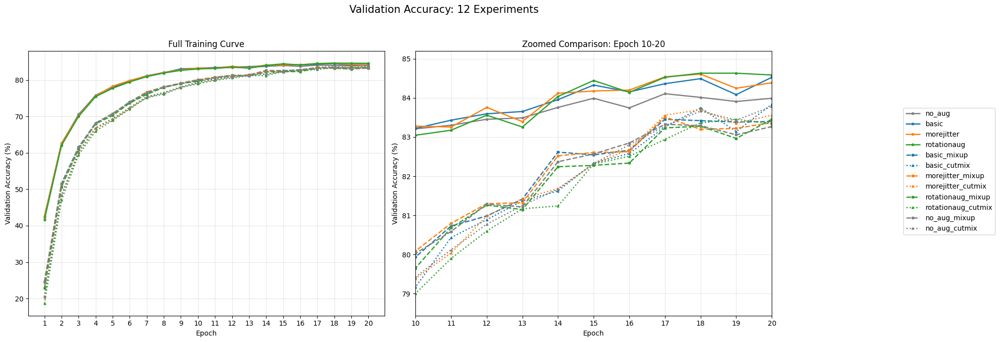

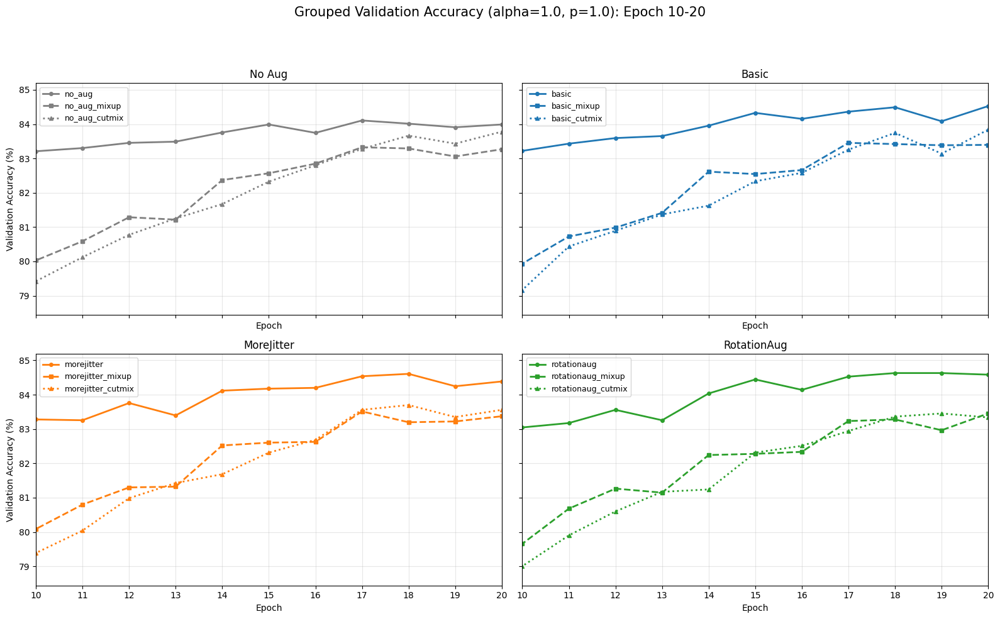

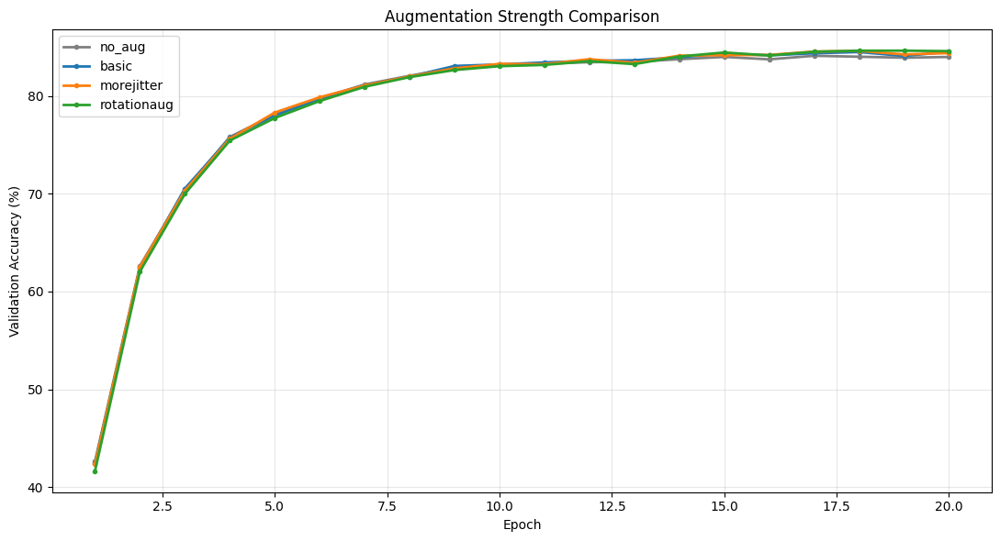

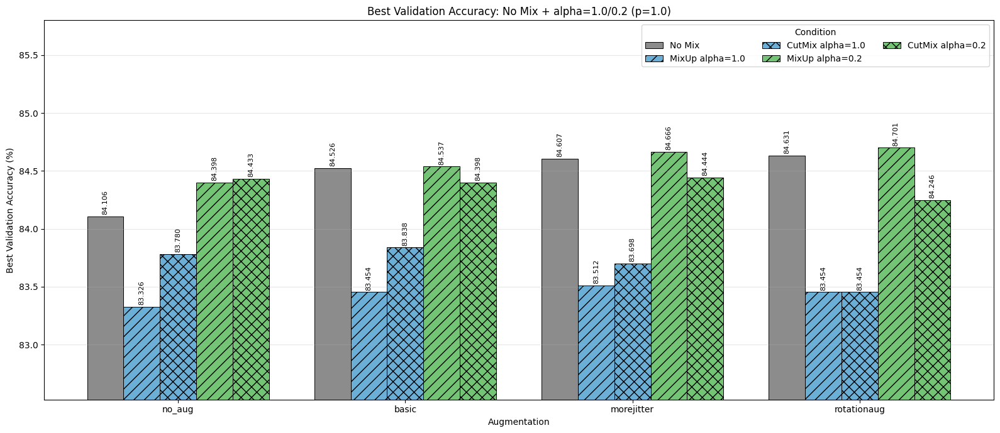

In [52]:
AUGMENTATION_COLORS = {
    "none": "gray",
    "basic": "tab:blue",
    "morejitter": "tab:orange",
    "rotationaug": "tab:green",
}
BATCH_MIX_STYLES = {
    "none": {"linestyle": "-", "marker": "o"},
    "mixup": {"linestyle": "--", "marker": "s"},
    "cutmix": {"linestyle": ":", "marker": "^"},
}
EXPERIMENT_LOOKUP = {
    experiment["name"]: experiment for experiment in EXPERIMENTS
}


def experiment_plot_style(experiment_name):
    config = EXPERIMENT_LOOKUP[experiment_name]
    return {
        "color": AUGMENTATION_COLORS[config["augmentation"]],
        **BATCH_MIX_STYLES[config["batch_mix"]],
    }


def save_validation_accuracy_plot(history_df, zoom_start_epoch=10):
    fig, axes = plt.subplots(1, 2, figsize=(18, 7))
    experiment_names = list(history_df["experiment"].drop_duplicates())

    for experiment_name in experiment_names:
        group = history_df[history_df["experiment"] == experiment_name]
        style = experiment_plot_style(experiment_name)
        for ax in axes:
            ax.plot(
                group["epoch"],
                group["val_accuracy"],
                markersize=3,
                linewidth=1.8,
                label=experiment_name,
                **style,
            )

    axes[0].set_title("Full Training Curve")
    axes[0].set_xlabel("Epoch")
    axes[0].set_ylabel("Validation Accuracy (%)")

    zoom_df = history_df[history_df["epoch"] >= zoom_start_epoch]
    zoom_min = zoom_df["val_accuracy"].min()
    zoom_max = zoom_df["val_accuracy"].max()
    zoom_padding = max(0.5, (zoom_max - zoom_min) * 0.1)
    axes[1].set_xlim(zoom_start_epoch, EPOCHS)
    axes[1].set_ylim(zoom_min - zoom_padding, zoom_max + zoom_padding)
    axes[1].set_title(f"Zoomed Comparison: Epoch {zoom_start_epoch}-{EPOCHS}")
    axes[1].set_xlabel("Epoch")
    axes[1].set_ylabel("Validation Accuracy (%)")

    axes[0].set_xticks(range(1, EPOCHS + 1))
    axes[1].set_xticks(range(zoom_start_epoch, EPOCHS + 1))
    for ax in axes:
        ax.grid(True, alpha=0.3)

    handles, labels = axes[1].get_legend_handles_labels()
    fig.legend(handles, labels, bbox_to_anchor=(1.01, 0.5), loc="center left")
    fig.suptitle("Validation Accuracy: 12 Experiments", fontsize=15)
    fig.tight_layout(rect=[0, 0, 0.88, 0.95])
    fig.savefig(
        RESULT_DIR / "validation_accuracy.png",
        dpi=200,
        bbox_inches="tight",
    )
    plt.show()


def save_grouped_validation_accuracy(history_df, zoom_start_epoch=10):
    groups = {
        "No Aug": ["no_aug", "no_aug_mixup", "no_aug_cutmix"],
        "Basic": ["basic", "basic_mixup", "basic_cutmix"],
        "MoreJitter": ["morejitter", "morejitter_mixup", "morejitter_cutmix"],
        "RotationAug": ["rotationaug", "rotationaug_mixup", "rotationaug_cutmix"],
    }
    zoom_df = history_df[history_df["epoch"] >= zoom_start_epoch]
    zoom_min = zoom_df["val_accuracy"].min()
    zoom_max = zoom_df["val_accuracy"].max()
    zoom_padding = max(0.5, (zoom_max - zoom_min) * 0.1)

    fig, axes = plt.subplots(2, 2, figsize=(16, 10), sharex=True, sharey=True)
    for ax, (title, names) in zip(axes.flat, groups.items()):
        for name in names:
            group = history_df[history_df["experiment"] == name]
            if group.empty:
                continue

            style = experiment_plot_style(name)
            ax.plot(
                group["epoch"],
                group["val_accuracy"],
                label=name,
                linewidth=2,
                markersize=4,
                **style,
            )

        ax.set_xlim(zoom_start_epoch, EPOCHS)
        ax.set_ylim(zoom_min - zoom_padding, zoom_max + zoom_padding)
        ax.set_title(title)
        ax.set_xlabel("Epoch")
        ax.set_xticks(range(zoom_start_epoch, EPOCHS + 1))
        ax.grid(True, alpha=0.3)
        ax.legend(fontsize=9)

    axes[0, 0].set_ylabel("Validation Accuracy (%)")
    axes[1, 0].set_ylabel("Validation Accuracy (%)")
    fig.suptitle(
        f"Grouped Validation Accuracy (alpha=1.0, p=1.0): "
        f"Epoch {zoom_start_epoch}-{EPOCHS}",
        fontsize=15,
    )
    fig.tight_layout(rect=[0, 0, 1, 0.93])
    fig.savefig(
        RESULT_DIR / "validation_accuracy_grouped.png",
        dpi=200,
        bbox_inches="tight",
    )
    plt.show()


def save_augmentation_comparison(history_df):
    names = ["no_aug", "basic", "morejitter", "rotationaug"]
    fig, ax = plt.subplots(figsize=(11, 6))
    for name in names:
        group = history_df[history_df["experiment"] == name]
        if not group.empty:
            style = experiment_plot_style(name)
            ax.plot(
                group["epoch"],
                group["val_accuracy"],
                markersize=3,
                label=name,
                linewidth=2,
                **style,
            )

    ax.set_title("Augmentation Strength Comparison")
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Validation Accuracy (%)")
    ax.grid(True, alpha=0.3)
    ax.legend()
    fig.tight_layout()
    fig.savefig(
        RESULT_DIR / "augmentation_comparison.png",
        dpi=200,
        bbox_inches="tight",
    )
    plt.show()


def build_five_condition_summary(alpha10_summary_df):
    alpha02_summary_path = ALPHA02_RESULT_DIR / "experiment_summary.csv"
    if not alpha02_summary_path.exists():
        raise FileNotFoundError(
            f"Alpha 0.2 결과가 없습니다: {alpha02_summary_path}"
        )

    alpha10_df = alpha10_summary_df.copy()
    alpha10_df["condition"] = alpha10_df.apply(
        lambda row: "no_mix"
        if row["batch_mix"] == "none"
        else f"{row['batch_mix']}_alpha1.0",
        axis=1,
    )

    alpha02_df = pd.read_csv(alpha02_summary_path)
    alpha02_df["condition"] = alpha02_df.apply(
        lambda row: f"{row['batch_mix']}_alpha0.2",
        axis=1,
    )

    combined_df = pd.concat(
        [alpha10_df, alpha02_df],
        ignore_index=True,
    )
    condition_order = [
        "no_mix",
        "mixup_alpha1.0",
        "cutmix_alpha1.0",
        "mixup_alpha0.2",
        "cutmix_alpha0.2",
    ]
    comparison_df = combined_df.pivot(
        index="augmentation",
        columns="condition",
        values="best_val_accuracy",
    ).reindex(
        index=["none", "basic", "morejitter", "rotationaug"],
        columns=condition_order,
    )
    comparison_df.index = [
        "no_aug", "basic", "morejitter", "rotationaug"
    ]
    comparison_df.to_csv(RESULT_DIR / "best_val_accuracy_5_conditions.csv")
    return comparison_df


def save_batch_mix_comparison(summary_df):
    comparison_df = build_five_condition_summary(summary_df)
    styles = {
        "no_mix": {"label": "No Mix", "color": "#8c8c8c", "hatch": ""},
        "mixup_alpha1.0": {"label": "MixUp alpha=1.0", "color": "#6baed6", "hatch": "//"},
        "cutmix_alpha1.0": {"label": "CutMix alpha=1.0", "color": "#6baed6", "hatch": "xx"},
        "mixup_alpha0.2": {"label": "MixUp alpha=0.2", "color": "#74c476", "hatch": "//"},
        "cutmix_alpha0.2": {"label": "CutMix alpha=0.2", "color": "#74c476", "hatch": "xx"},
    }

    fig, ax = plt.subplots(figsize=(16, 7))
    x_positions = np.arange(len(comparison_df.index))
    bar_width = 0.16

    for column_index, condition in enumerate(comparison_df.columns):
        style = styles[condition]
        offsets = x_positions + (column_index - 2) * bar_width
        bars = ax.bar(
            offsets,
            comparison_df[condition],
            width=bar_width,
            color=style["color"],
            hatch=style["hatch"],
            edgecolor="black",
            linewidth=0.7,
            label=style["label"],
        )
        ax.bar_label(bars, fmt="%.3f", padding=2, fontsize=8, rotation=90)

    bar_min = comparison_df.min().min()
    bar_max = comparison_df.max().max()
    ax.set_ylim(bar_min - 0.8, bar_max + 1.1)
    ax.set_xticks(x_positions)
    ax.set_xticklabels(comparison_df.index)
    ax.set_title(
        "Best Validation Accuracy: No Mix + "
        "alpha=1.0/0.2 (p=1.0)"
    )
    ax.set_xlabel("Augmentation")
    ax.set_ylabel("Best Validation Accuracy (%)")
    ax.grid(axis="y", alpha=0.3)
    ax.legend(title="Condition", ncol=3)
    fig.tight_layout()
    fig.savefig(
        RESULT_DIR / "batch_mix_comparison.png",
        dpi=200,
        bbox_inches="tight",
    )
    plt.show()


save_validation_accuracy_plot(training_history_df)
save_grouped_validation_accuracy(training_history_df)
save_augmentation_comparison(training_history_df)
save_batch_mix_comparison(experiment_summary_df)


(alpha=0.2의 경우 다른 노트북에서 실험하고 결과만 첨부함, node-2-alpha02.ipynb 참고)  
먼저 3번 전체 학습 그래프를 통해 epoch=20에서 수렴이 어느정도 된 것으로 확인할 수 있다.   

alpha = 0.2 조정의 영향으로 cut 계열 증강들은 기존의 alpha=1.0의 경우보다 1%p정도 개선이 된 것으로 볼 수 있으나, 현재 그래프의 배율이 매우 높음에도 원본에 비해 매우 근소하게 낫거나 혹은 더 낮은 정확도를 보인다. 즉, 이 고생을 하면서 굳이 쓸 이유가 없다는 것이다.  

이런게 현실일리 없다. 
아마 지금 모델은 모든 배치가 mixup이나 cutmix로 잘리고 재배치된 자료만을 보고 있기에 헷갈릴 가능성이 있다고 생각해 그 다음 실험을 기획하였는데, 이번에는 p=0.5로 놓아 배치의 절반은 섞인 데이터, 절반은 기존 데이터로 학습하도록 했다.




### p = 0.5 비교




condition,no_mix,mixup_alpha1.0_p1.0,cutmix_alpha1.0_p1.0,mixup_alpha0.2_p1.0,cutmix_alpha0.2_p1.0,mixup_alpha0.2_p0.5,cutmix_alpha0.2_p0.5
no_aug,84.106,83.326,83.780,84.398,84.433,84.304,84.491
basic,84.526,83.454,83.838,84.537,84.398,84.607,84.805
morejitter,84.607,83.512,83.698,84.666,84.444,84.549,84.712
rotationaug,84.631,83.454,83.454,84.701,84.246,84.677,84.619


experiment
basic_cutmix_alpha0.2_p0.5          0.4993
basic_mixup_alpha0.2_p0.5           0.4993
morejitter_cutmix_alpha0.2_p0.5     0.4993
morejitter_mixup_alpha0.2_p0.5      0.4993
no_aug_cutmix_alpha0.2_p0.5         0.4993
no_aug_mixup_alpha0.2_p0.5          0.4993
rotationaug_cutmix_alpha0.2_p0.5    0.4993
rotationaug_mixup_alpha0.2_p0.5     0.4993
Name: mean_actual_mix_ratio, dtype: float64

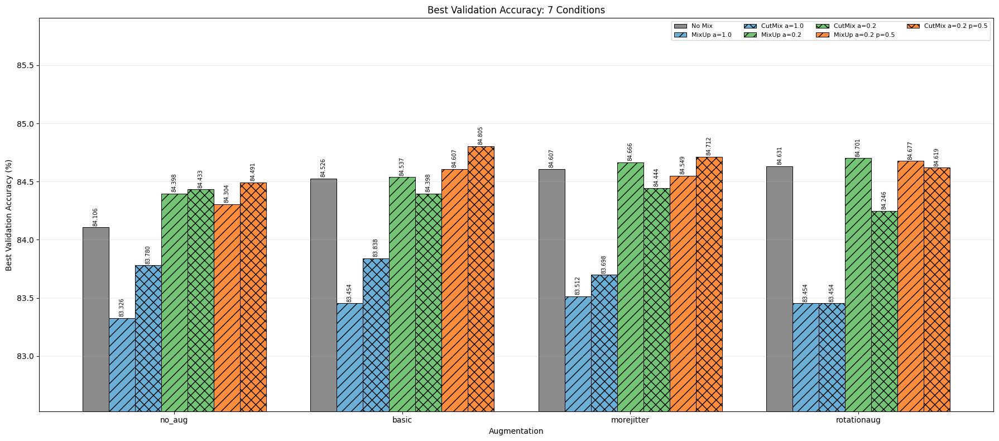

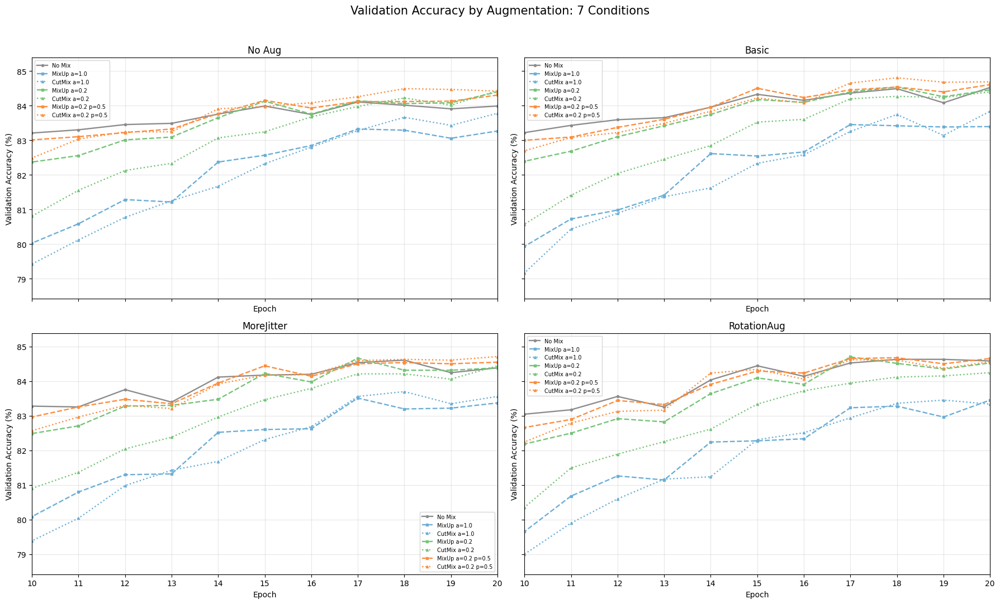

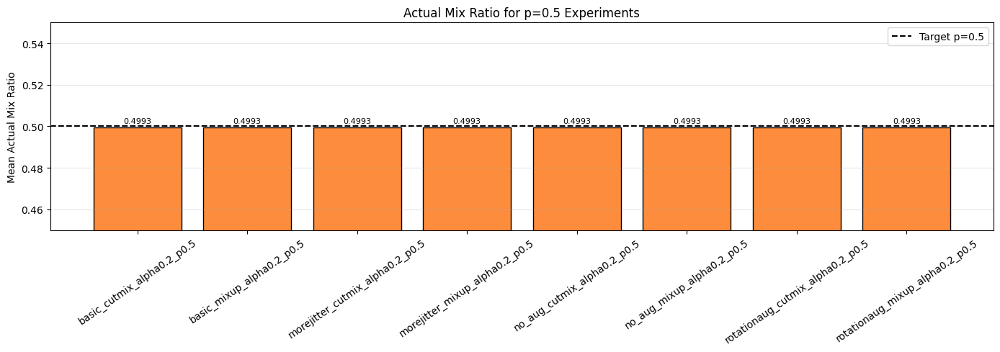

7조건 통합 검증 및 저장이 완료되었습니다.


In [46]:
ALPHA02_RESULT_DIR = Path("results_resnet50_aug_alpha02")
P05_RESULT_DIR = Path("results_resnet50_aug_alpha02_p05")

seven_condition_sources = {
    "alpha1": RESULT_DIR / "training_history.csv",
    "alpha02": ALPHA02_RESULT_DIR / "training_history.csv",
    "alpha02_p05": P05_RESULT_DIR / "training_history.csv",
}
missing_sources = [
    path for path in seven_condition_sources.values() if not path.exists()
]
if missing_sources:
    raise FileNotFoundError(f"통합에 필요한 CSV가 없습니다: {missing_sources}")

alpha1_history = pd.read_csv(seven_condition_sources["alpha1"])
alpha02_history = pd.read_csv(seven_condition_sources["alpha02"])
p05_history = pd.read_csv(seven_condition_sources["alpha02_p05"])

alpha1_metadata = {
    experiment["name"]: experiment for experiment in EXPERIMENTS
}
alpha1_history["augmentation"] = alpha1_history["experiment"].map(
    lambda name: alpha1_metadata[name]["augmentation"]
)
alpha1_history["batch_mix"] = alpha1_history["experiment"].map(
    lambda name: alpha1_metadata[name]["batch_mix"]
)
alpha1_history["mix_alpha"] = np.where(
    alpha1_history["batch_mix"].eq("none"), np.nan, 1.0
)
alpha1_history["mix_probability"] = np.where(
    alpha1_history["batch_mix"].eq("none"), np.nan, 1.0
)
alpha02_history["mix_probability"] = 1.0

def seven_condition_name(row):
    if row["batch_mix"] == "none":
        return "no_mix"
    return (
        f"{row['batch_mix']}_alpha{row['mix_alpha']}"
        f"_p{row['mix_probability']}"
    )

seven_condition_history = pd.concat(
    [alpha1_history, alpha02_history, p05_history],
    ignore_index=True,
    sort=False,
)
seven_condition_history["condition"] = seven_condition_history.apply(
    seven_condition_name, axis=1
)

expected_epoch_counts = seven_condition_history.groupby("experiment")[
    "epoch"
].count()
assert (expected_epoch_counts == EPOCHS).all()
assert not seven_condition_history.duplicated(
    ["experiment", "epoch"]
).any()

summary_rows = []
for experiment_name, group in seven_condition_history.groupby(
    "experiment", sort=False
):
    best_row = group.loc[group["val_accuracy"].idxmax()]
    final_row = group.iloc[-1]
    summary_rows.append({
        "experiment": experiment_name,
        "augmentation": final_row["augmentation"],
        "condition": final_row["condition"],
        "best_epoch": int(best_row["epoch"]),
        "best_val_accuracy": best_row["val_accuracy"],
        "final_val_accuracy": final_row["val_accuracy"],
        "final_val_loss": final_row["val_loss"],
    })

seven_condition_summary = pd.DataFrame(summary_rows)
seven_condition_order = [
    "no_mix",
    "mixup_alpha1.0_p1.0",
    "cutmix_alpha1.0_p1.0",
    "mixup_alpha0.2_p1.0",
    "cutmix_alpha0.2_p1.0",
    "mixup_alpha0.2_p0.5",
    "cutmix_alpha0.2_p0.5",
]
seven_condition_table = seven_condition_summary.pivot(
    index="augmentation",
    columns="condition",
    values="best_val_accuracy",
).reindex(
    index=["none", "basic", "morejitter", "rotationaug"],
    columns=seven_condition_order,
)
seven_condition_table.index = [
    "no_aug", "basic", "morejitter", "rotationaug"
]
assert seven_condition_table.shape == (4, 7)
assert not seven_condition_table.isna().any().any()

existing_five = pd.read_csv(
    RESULT_DIR / "best_val_accuracy_5_conditions.csv", index_col=0
)
common_column_map = {
    "no_mix": "no_mix",
    "mixup_alpha1.0": "mixup_alpha1.0_p1.0",
    "cutmix_alpha1.0": "cutmix_alpha1.0_p1.0",
    "mixup_alpha0.2": "mixup_alpha0.2_p1.0",
    "cutmix_alpha0.2": "cutmix_alpha0.2_p1.0",
}
for old_name, new_name in common_column_map.items():
    assert np.allclose(
        existing_five[old_name], seven_condition_table[new_name]
    )

p05_mean_ratio = p05_history.groupby("experiment")[
    "actual_mix_ratio"
].mean().sort_index()
assert p05_mean_ratio.between(0.45, 0.55).all()

seven_condition_history.to_csv(
    RESULT_DIR / "seven_condition_training_history.csv", index=False
)
seven_condition_summary.to_csv(
    RESULT_DIR / "seven_condition_summary.csv", index=False
)
seven_condition_table.to_csv(
    RESULT_DIR / "seven_condition_best_val_accuracy.csv"
)
p05_mean_ratio.rename("mean_actual_mix_ratio").to_csv(
    RESULT_DIR / "p05_actual_mix_ratio.csv"
)

display(seven_condition_table.round(3))
display(p05_mean_ratio.rename("mean_actual_mix_ratio").round(4))

SEVEN_CONDITION_STYLES = {
    "no_mix": {"label": "No Mix", "color": "#8c8c8c", "hatch": ""},
    "mixup_alpha1.0_p1.0": {"label": "MixUp a=1.0", "color": "#6baed6", "hatch": "//"},
    "cutmix_alpha1.0_p1.0": {"label": "CutMix a=1.0", "color": "#6baed6", "hatch": "xx"},
    "mixup_alpha0.2_p1.0": {"label": "MixUp a=0.2", "color": "#74c476", "hatch": "//"},
    "cutmix_alpha0.2_p1.0": {"label": "CutMix a=0.2", "color": "#74c476", "hatch": "xx"},
    "mixup_alpha0.2_p0.5": {"label": "MixUp a=0.2 p=0.5", "color": "#fd8d3c", "hatch": "//"},
    "cutmix_alpha0.2_p0.5": {"label": "CutMix a=0.2 p=0.5", "color": "#fd8d3c", "hatch": "xx"},
}

fig, ax = plt.subplots(figsize=(18, 8))
x_positions = np.arange(len(seven_condition_table.index))
bar_width = 0.115
for column_index, condition in enumerate(seven_condition_table.columns):
    style = SEVEN_CONDITION_STYLES[condition]
    offsets = x_positions + (column_index - 3) * bar_width
    bars = ax.bar(
        offsets,
        seven_condition_table[condition],
        width=bar_width,
        label=style["label"],
        color=style["color"],
        hatch=style["hatch"],
        edgecolor="black",
        linewidth=0.7,
    )
    ax.bar_label(bars, fmt="%.3f", padding=2, fontsize=7, rotation=90)
ax.set_ylim(
    seven_condition_table.min().min() - 0.8,
    seven_condition_table.max().max() + 1.1,
)
ax.set_xticks(x_positions)
ax.set_xticklabels(seven_condition_table.index)
ax.set_title("Best Validation Accuracy: 7 Conditions")
ax.set_xlabel("Augmentation")
ax.set_ylabel("Best Validation Accuracy (%)")
ax.grid(axis="y", alpha=0.3)
ax.legend(ncol=4, fontsize=8)
fig.tight_layout()
fig.savefig(
    RESULT_DIR / "seven_condition_best_val_accuracy.png",
    dpi=200,
    bbox_inches="tight",
)
plt.show()

fig, axes = plt.subplots(2, 2, figsize=(18, 11), sharex=True, sharey=True)
augmentation_titles = {
    "none": "No Aug", "basic": "Basic",
    "morejitter": "MoreJitter", "rotationaug": "RotationAug",
}
zoom_history = seven_condition_history[
    seven_condition_history["epoch"] >= 10
]
zoom_min = zoom_history["val_accuracy"].min()
zoom_max = zoom_history["val_accuracy"].max()
zoom_padding = max(0.4, (zoom_max - zoom_min) * 0.1)
for ax, augmentation in zip(axes.flat, augmentation_titles):
    subset = seven_condition_history[
        seven_condition_history["augmentation"] == augmentation
    ]
    for condition in seven_condition_order:
        group = subset[subset["condition"] == condition]
        if group.empty:
            continue
        style = SEVEN_CONDITION_STYLES[condition]
        ax.plot(
            group["epoch"], group["val_accuracy"],
            label=style["label"], color=style["color"],
            linestyle=":" if "cutmix" in condition else "-" if condition == "no_mix" else "--",
            marker="^" if "cutmix" in condition else "o" if condition == "no_mix" else "s",
            linewidth=1.7, markersize=3,
        )
    ax.set_title(augmentation_titles[augmentation])
    ax.set_xlim(10, EPOCHS)
    ax.set_ylim(zoom_min - zoom_padding, zoom_max + zoom_padding)
    ax.set_xticks(range(10, EPOCHS + 1))
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Validation Accuracy (%)")
    ax.grid(True, alpha=0.3)
    ax.legend(fontsize=7)
fig.suptitle("Validation Accuracy by Augmentation: 7 Conditions", fontsize=15)
fig.tight_layout(rect=[0, 0, 1, 0.96])
fig.savefig(
    RESULT_DIR / "seven_condition_validation_accuracy.png",
    dpi=200,
    bbox_inches="tight",
)
plt.show()

fig, ax = plt.subplots(figsize=(14, 5))
ratio_bars = ax.bar(
    p05_mean_ratio.index,
    p05_mean_ratio.values,
    color="#fd8d3c",
    edgecolor="black",
)
ax.axhline(0.5, color="black", linestyle="--", label="Target p=0.5")
ax.bar_label(ratio_bars, fmt="%.4f", padding=3, fontsize=8)
ax.set_ylim(0.45, 0.55)
ax.set_title("Actual Mix Ratio for p=0.5 Experiments")
ax.set_ylabel("Mean Actual Mix Ratio")
ax.tick_params(axis="x", rotation=35)
ax.grid(axis="y", alpha=0.3)
ax.legend()
fig.tight_layout()
fig.savefig(
    RESULT_DIR / "p05_actual_mix_ratio.png",
    dpi=200,
    bbox_inches="tight",
)
plt.show()

print("7조건 통합 검증 및 저장이 완료되었습니다.")


제한적인 조건에서 아주 조금 나아지는 경향을 보이기는 했지만, 크게 막 나아지진 않았다.  

결론  
---

mix를 제외한 증강(jitter, rotation)들은 더 많이 가할수록 더 좋은 성능을 내는 경향을 보였다.   
그러나 mixup, cutmix의 경우 더 가한다고 해서 더 개선되지는 않았고, 개선되더라도 그 폭이 극히 미미하여(최고 +0.3%p) 노이즈와 구분하기도 힘들었으나, augmentation이 그저 성능을 올리기보다는 과적합을 방지하는 규제의 역할도 겸함을 생각할 때 마냥 의미가 없다고만 하기에는 섣부른 감이 있으며 앞서 말한 cut 영역을 그저 랜덤으로 적용하는 한계때문에 제 성능이 다 나오지 않았을 가능성도 배제할 수 없다. 

다시 한번 돌려본 예측 

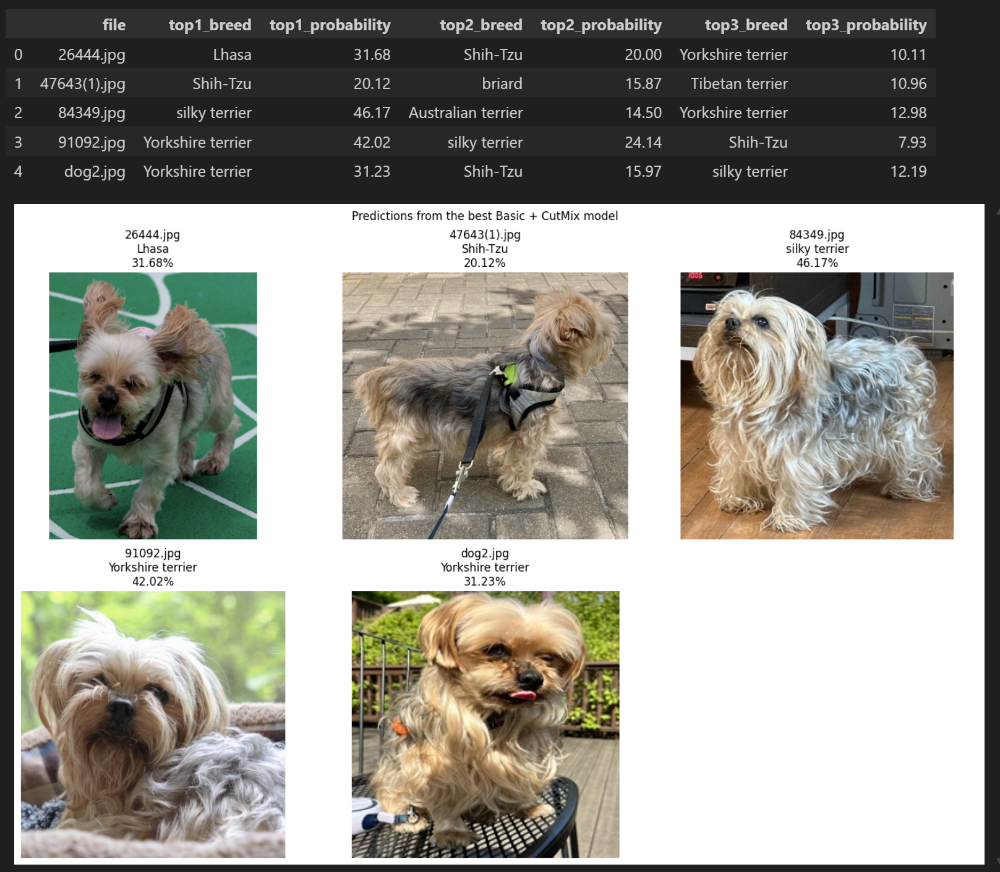